In [1]:
import warnings
warnings.simplefilter("ignore")
target_size=(64, 64)

#  <font color='#F5BCA9 '> Tarea: Procesamiento de audio   </font>

####  <font color='#F5BCA9 '> Realizado por: Ixchel Dafne Avendaño Pacheco  </font>

##### Matricula: 23265456

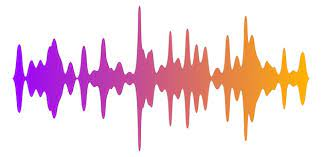

Importamos las librerias necesarias 


In [2]:
from IPython.display import Audio
import matplotlib.pyplot as plt
import numpy as np
import librosa
from scipy.signal import butter, lfilter

####  <font color='#F5BCA9 '> Reproducir audio  </font>

Reproducimos un audio en formato ogg. Este audio corresponde a un ave cantando 

In [3]:
Audio(url="https://upload.wikimedia.org/wikipedia/commons/4/42/Bird_singing.ogg")

##  <font color='#F5BCA9 '> Procesamientos  </font>

Generamos el audio 1 a partir de la suma de cuatro señales senoidales multiplos de 20

In [4]:
framerate = 44100
t = np.linspace(0,5,framerate*5)
data1 = np.sin(2*np.pi*20*t) + np.sin(2*np.pi*200*t)+ np.sin(2*np.pi*1000*t) + np.sin(2*np.pi*2000*t)
Audio(data1,rate=framerate)

###  <font color='#F5BCA9 '> Dominio del tiempo  </font>
Observamos su gráfica en el dominio del tiempo 

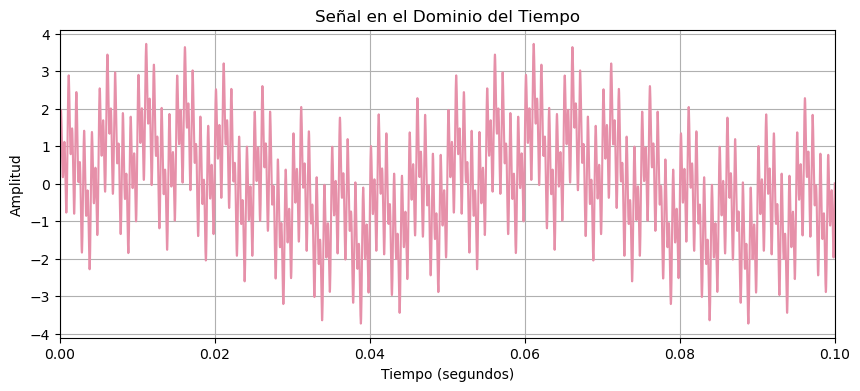

In [5]:
plt.figure(figsize=(10, 4))
plt.plot(t, data1, color='#E690A9')
plt.title('Señal en el Dominio del Tiempo')
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.xlim(0,0.1 ) 
plt.grid(True)
plt.show()

Observemos que, debido a que las frecuencias son multiplos de 20 la señal senoidal se ve montada en otra señal senoidal que oscila a mayor frecuencia. Pero al hacer las sumas de las cuatro señales no se pierde la forma caracteristica de una señal senoidal. 

Generamos el audio 2 a partir de la suma de tres señales senoidales que no son multiplos ni submultiplos entre si 

In [6]:
framerate = 44100
t = np.linspace(0,5,framerate*5)
data2 = np.sin(2*np.pi*237*t) + np.sin(2*np.pi*313*t)+ np.sin(2*np.pi*274*t)
Audio(data2,rate=framerate)

Observamos su gráfica en el dominio del tiempo 

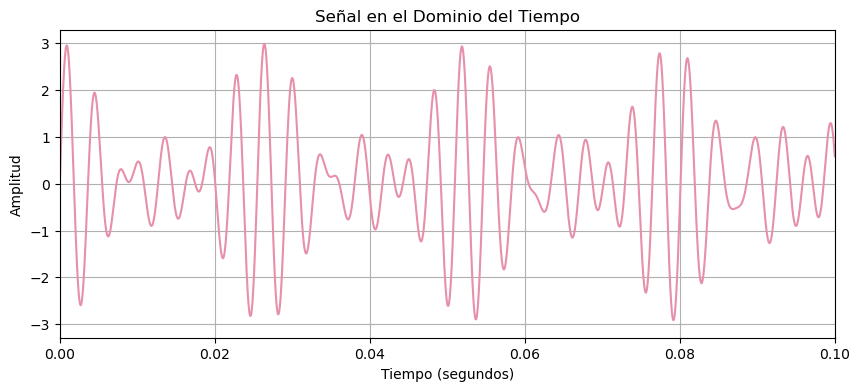

In [7]:
plt.figure(figsize=(10, 4))
plt.plot(t, data2, color='#E690A9')
plt.title('Señal en el Dominio del Tiempo')
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.xlim(0,0.1 ) 
plt.grid(True)
plt.show()

Observemos ahora que, debido a que las frecuencias no son multiplos ni submultiplos entre si la señal senoidal asemeja la onda de una señal modulada en frecuencia. Al hacer las sumas de las tres señales no se pierde la forma caracteristica de una señal senoidal.
###  <font color='#F5BCA9 '> Dominio de la frecuencia  </font>

Ahora observamos el comportamiento de estos audios en el dominio de la frecuencia.

Empecemos por el audio 1 

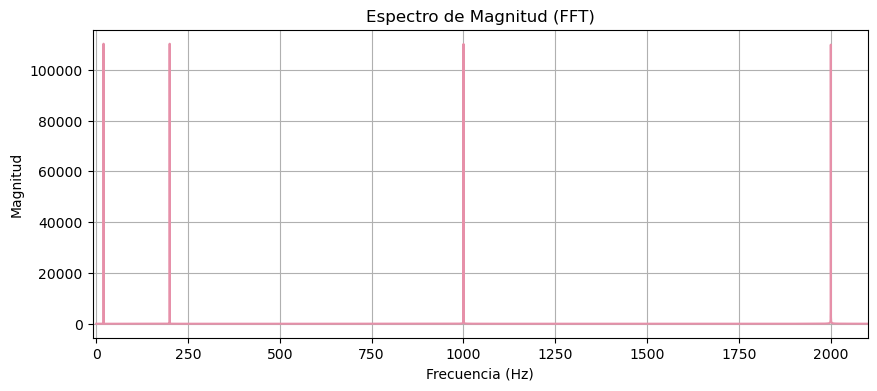

In [8]:
fft_result = np.fft.fft(data1)

# Calcular las frecuencias correspondientes
frequencies = np.fft.fftfreq(len(fft_result), d=1/framerate)

# Tomar solo las frecuencias positivas (la mitad debido a la simetría)
positive_frequencies = frequencies[:len(frequencies)//2]
magnitude_spectrum = np.abs(fft_result[:len(fft_result)//2])

# Graficar el espectro de magnitud
plt.figure(figsize=(10, 4))
plt.plot(positive_frequencies, magnitude_spectrum, color='#E690A9' )
plt.title('Espectro de Magnitud (FFT)')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Magnitud')
plt.xlim(-10,2100 ) 
plt.grid(True)
plt.show()

Observemos que se observan 4 frecuencias coorespondiente a las que nosotros asignamos previamente, las cuales son: 20, 200, 1000, 2000 además, todas las frecuencias tienen la misma magnitud


Ahora observemos los componentes en frecuencia del segundo audio

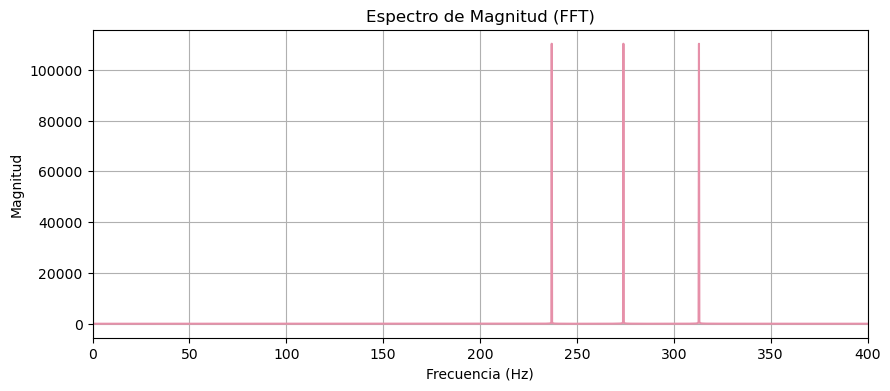

In [9]:
fft_result = np.fft.fft(data2)

# Calcular las frecuencias correspondientes
frequencies = np.fft.fftfreq(len(fft_result), d=1/framerate)

# Tomar solo las frecuencias positivas (la mitad debido a la simetría)
positive_frequencies = frequencies[:len(frequencies)//2]
magnitude_spectrum = np.abs(fft_result[:len(fft_result)//2])

# Graficar el espectro de magnitud
plt.figure(figsize=(10, 4))
plt.plot(positive_frequencies, magnitude_spectrum, color='#E690A9')
plt.title('Espectro de Magnitud (FFT)')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Magnitud')
plt.xlim(0,400 ) 
plt.grid(True)
plt.show()

Notemos ahora que se observan 3 frecuencias coorespondiente a las que nosotros asignamos previamente, las cuales son: 237, 274, 313, además, todas las frecuencias tienen la misma magnitud


###  <font color='#F5BCA9 '> Operaciones con señales  </font>

Al sumar los audios contenidos en data 1 y data 2 tendremos un nuevo audio, de igual forma en la multiplicación, esto debido a que se estan multiplicando las señales senoidales resultantes generando un nuevo audio y  más adelante observaremos que la amplitud en este caso será diferente. 

Multiplicación 

In [10]:
data3 = data1 * data2
Audio(data3,rate=framerate)

Observamos su gráfica en el dominio del tiempo 

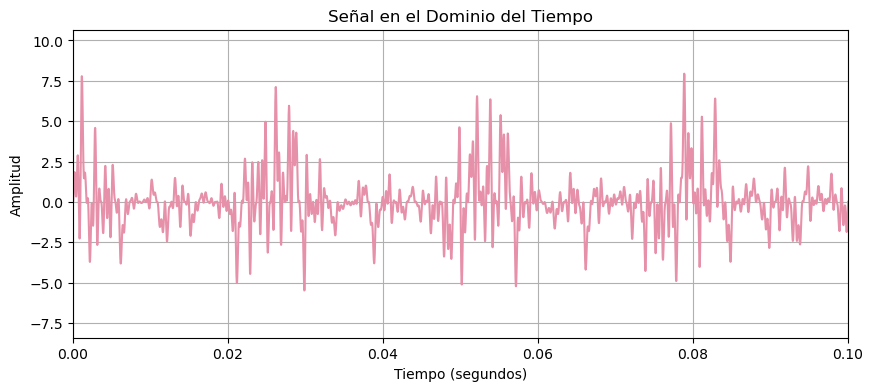

In [11]:
plt.figure(figsize=(10, 4))
plt.plot(t, data3, color='#E690A9')
plt.title('Señal en el Dominio del Tiempo')
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.xlim(0,0.1 ) 
plt.grid(True)
plt.show()

Observemos ahora que,  la señal resultante de haber multiplicado el audio 1 por el audio 2.


Dominio de la frecuencia 

Ahora observamos el comportamiento de este audios en el dominio de la frecuencia.



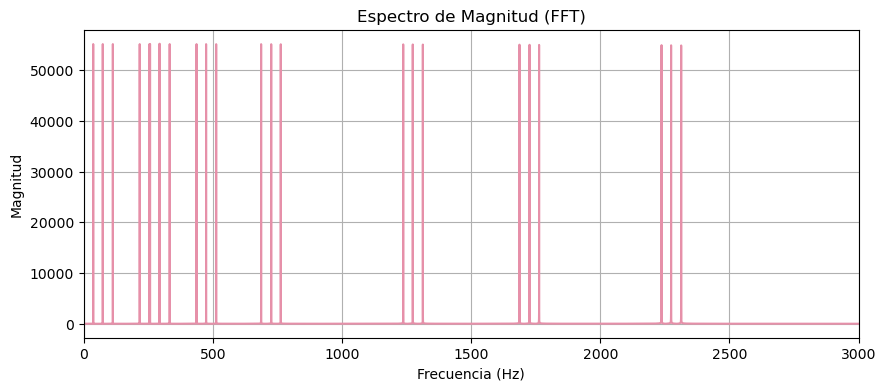

In [12]:
fft_result = np.fft.fft(data3)

# Calcular las frecuencias correspondientes
frequencies = np.fft.fftfreq(len(fft_result), d=1/framerate)

# Tomar solo las frecuencias positivas (la mitad debido a la simetría)
positive_frequencies = frequencies[:len(frequencies)//2]
magnitude_spectrum = np.abs(fft_result[:len(fft_result)//2])

# Graficar el espectro de magnitud
plt.figure(figsize=(10, 4))
plt.plot(positive_frequencies, magnitude_spectrum, color='#E690A9')
plt.title('Espectro de Magnitud (FFT)')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Magnitud')
plt.xlim(0,3000 ) 
plt.grid(True)
plt.show()

###  <font color='#F5BCA9 '> Filtrado de señales  </font>

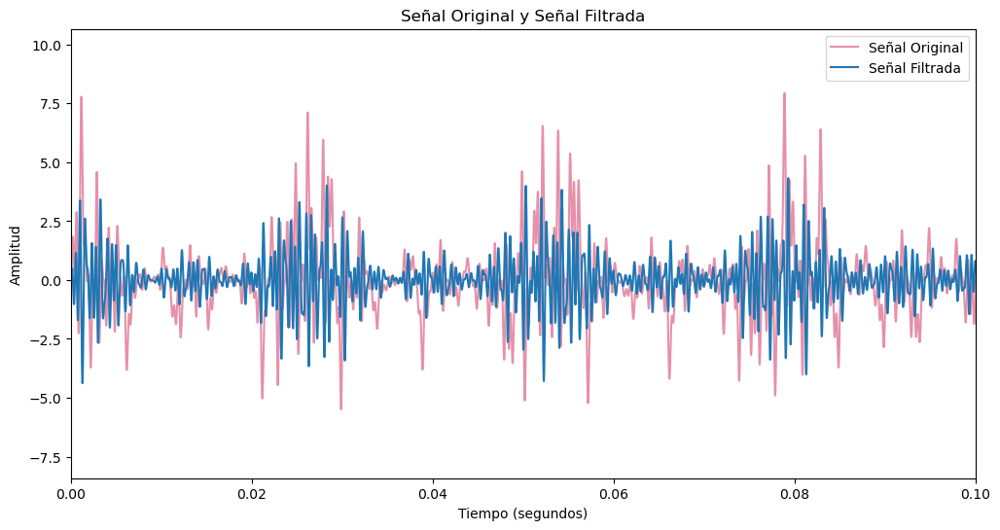

In [13]:
# Frecuencia de corte del filtro pasa altas
cutoff_freq = 1000

# Orden del filtro
order = 4

# Normalización de la frecuencia de corte
nyquist = 0.5 * framerate
normal_cutoff = cutoff_freq / nyquist

# Diseño del filtro Butterworth pasa altas
b, a = butter(order, normal_cutoff, btype='high', analog=False)

# Filtrar la señal original
data_filtrada = lfilter(b, a, data3)


# Graficar la señal original y filtrada en el dominio del tiempo
plt.figure(figsize=(12, 6))
plt.plot(t, data3, label='Señal Original', color='#E690A9')
plt.plot(t, data_filtrada, label='Señal Filtrada')
plt.title('Señal Original y Señal Filtrada')
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.xlim(0,0.1 ) 
plt.legend()
plt.show()

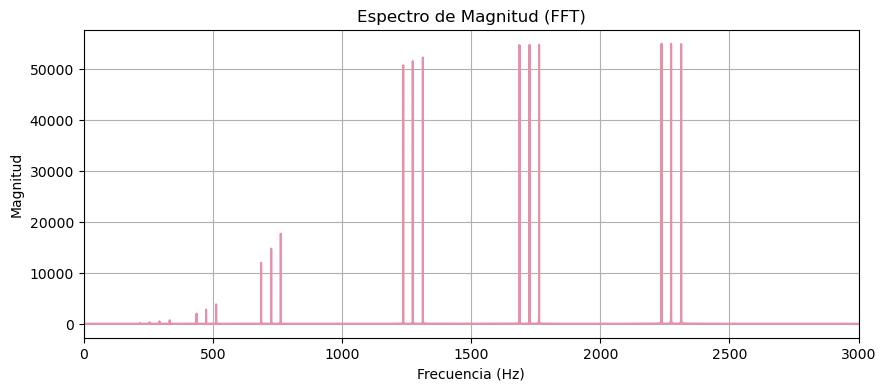

In [14]:
fft_result = np.fft.fft(data_filtrada)

# Calcular las frecuencias correspondientes
frequencies = np.fft.fftfreq(len(fft_result), d=1/framerate)

# Tomar solo las frecuencias positivas (la mitad debido a la simetría)
positive_frequencies = frequencies[:len(frequencies)//2]
magnitude_spectrum = np.abs(fft_result[:len(fft_result)//2])

# Graficar el espectro de magnitud
plt.figure(figsize=(10, 4))
plt.plot(positive_frequencies, magnitude_spectrum, color='#E690A9')
plt.title('Espectro de Magnitud (FFT)')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Magnitud')
plt.xlim(0,3000 ) 
plt.grid(True)
plt.show()

###  <font color='#F5BCA9 '> Operaciones con señales librosa  </font>

In [24]:
filename = librosa.example('sweetwaltz')

y1, sr1 = librosa.load(filename)

In [25]:
filename = librosa.example('humpback') 

y2, sr2 = librosa.load(filename)

In [26]:
Audio(data=y1 , rate=sr1)

In [27]:
Audio(data=y2 , rate=sr2)

In [28]:
print("Longitud de la señal y1:", len(y1))
print("Longitud de la señal y2:", len(y2))

Longitud de la señal y1: 1084860
Longitud de la señal y2: 1429039


In [31]:
y2=y2[0:1084860]
print("Longitud señal y2:", len(y2))

Longitud señal y2: 1084860


In [32]:
y3= y1 + y2

In [33]:
Audio(data=y3 , rate=sr1)